In [124]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from bs4 import BeautifulSoup
import requests
import seaborn as sns

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules

import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


##  Download and Explore Toronto
Neighborhood has a total of 10 boroughs and 200 neighborhoods. In order to segment the neighborhoods and explore them, we will essentially need a dataset that contains the 6 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood.

Obtain the neighborhoods in Toronto data from https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M . 

After obtain the data, postal code of each neighborhood along with the borough name and neighborhood name, in order to utilize the Foursquare location data, we need to get the latitude and the longitude coordinates of each neighborhood. https://github.com/denizerden/Battle-of-Neighborhoods/blob/master/Geospatial_Coordinates.csv will be used for this purpose. 


In [125]:
r = ''
while r == '':
    try:
        r = requests.get('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M')
        break
    except:
        print("Connection refused by the server..")
        print("Let me sleep for 5 seconds")
        print("ZZzzzz...")
        time.sleep(5)
        print("Was a nice sleep, now let me continue...")
        continue

source = BeautifulSoup(r.content,"lxml")
table = source.find('table')

Transform data into dataframe object.

In [126]:
df = pd.read_html(str(table))[0]
df.columns = ['PostalCode','Borough','Neighborhood']
df

,PostalCode,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"
5,M6A,North York,"Lawrence Manor, Lawrence Heights"
6,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"
7,M8A,Not assigned,Not assigned
8,M9A,Etobicoke,"Islington Avenue, Humber Valley Village"
9,M1B,Scarborough,"Malvern, Rouge"


## Preprocess Data

Drop rows with a borough that is Not assigned.

In [127]:
df = df.drop(df[(df.Borough == 'Not assigned')].index)
df.reset_index(drop=True, inplace=True)
df

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"
5,M9A,Etobicoke,"Islington Avenue, Humber Valley Village"
6,M1B,Scarborough,"Malvern, Rouge"
7,M3B,North York,Don Mills
8,M4B,East York,"Parkview Hill, Woodbine Gardens"
9,M5B,Downtown Toronto,"Garden District, Ryerson"


More than one neighborhood can exist in one postal code area. For example, in the table on the Wikipedia page, you will notice that M5A is listed twice and has two neighborhoods: Harbourfront and Regent Park. These two rows will be combined into one row with the neighborhoods separated with a comma.

In [128]:
df1=df.groupby("PostalCode").agg(lambda x:','.join(set(x))).reset_index()
df1

,PostalCode,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae
5,M1J,Scarborough,Scarborough Village
6,M1K,Scarborough,"Kennedy Park, Ionview, East Birchmount Park"
7,M1L,Scarborough,"Golden Mile, Clairlea, Oakridge"
8,M1M,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West"
9,M1N,Scarborough,"Birch Cliff, Cliffside West"


If a cell has a borough but a Not assigned neighborhood, then the neighborhood will be the same as the borough.

In [129]:
df1.loc[df1['Neighborhood']=="Not assigned",'Neighborhood']=df1.loc[df1['Neighborhood']=="Not assigned",'Borough']
df1.head(10)

,PostalCode,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae
5,M1J,Scarborough,Scarborough Village
6,M1K,Scarborough,"Kennedy Park, Ionview, East Birchmount Park"
7,M1L,Scarborough,"Golden Mile, Clairlea, Oakridge"
8,M1M,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West"
9,M1N,Scarborough,"Birch Cliff, Cliffside West"


In [130]:
df1.shape

(103, 3)

**In order to utilize the Foursquare location data, we need to get the latitude and the longitude coordinates of each neighborhood.**

In [131]:
location_df = pd.read_csv('Geospatial_Coordinates.csv')
location_df.columns = ['PostalCode','Latitude','Longitude']
location_df.head()

,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [132]:
df2 = df1.merge(location_df,on='PostalCode')
df2 = df2.drop('PostalCode',axis=1)
df2.head()

,Borough,Neighborhood,Latitude,Longitude
0,Scarborough,"Malvern, Rouge",43.806686,-79.194353
1,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497
2,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,Scarborough,Woburn,43.770992,-79.216917
4,Scarborough,Cedarbrae,43.773136,-79.239476


In [133]:
df2['Borough'].value_counts()

North York          24
Downtown Toronto    19
Scarborough         17
Etobicoke           12
Central Toronto      9
West Toronto         6
York                 5
East York            5
East Toronto         5
Mississauga          1
Name: Borough, dtype: int64

In [134]:
print('Toronto has {} boroughs and {} neighborhoods.'.format(
        len(df2['Borough'].unique()),
        df2.shape[0]
    )
)

Toronto has 10 boroughs and 103 neighborhoods.


### Use geopy library to get the latitude and longitude values of Toronto, Canada.

In [135]:
address = 'Toronto, CA'

geolocator = Nominatim(user_agent="toronto")
location = geolocator.geocode(address,timeout=10)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto, Canada are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto, Canada are 43.6534817, -79.3839347.


### Create a map of Toronto with neighborhoods superimposed on top.

In [136]:
# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(df2['Latitude'], df2['Longitude'], df2['Borough'], df2['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

Lets get the geographical coordinates of Central Toronto

## Explore Toronto with Foursquare API

Define Foursquare credentials and version

In [137]:
CLIENT_ID = 'SVC55VJSQEPOOKRN51ZSZYQ4JL3WGTOGX3UCOBI30PELPZP0' # your Foursquare ID
CLIENT_SECRET = 'ZQK01RBIM5WP3LOF03SAJAVGSSAMP5DUF12XBQHNAFKMS5HX' # your Foursquare Secret
VERSION = '20200605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: SVC55VJSQEPOOKRN51ZSZYQ4JL3WGTOGX3UCOBI30PELPZP0
CLIENT_SECRET:ZQK01RBIM5WP3LOF03SAJAVGSSAMP5DUF12XBQHNAFKMS5HX


### Function to explore neighborhoods

In [146]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            100)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        #print(results)
        if "success" in results and results["success"] == 0:
            raise ValueError("Request failed")
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    print('Found {} venues in {} neighborhoods.'.format(nearby_venues.shape[0], len(venues_list)))
    
    return(nearby_venues)

In [147]:
toronto_venues = getNearbyVenues(names=df2['Neighborhood'],
                                   latitudes=df2['Latitude'],
                                   longitudes=df2['Longitude']
                                  )

Found 2132 venues in 103 neighborhoods.


In [148]:
print(toronto_venues.shape)
toronto_venues.head()

(2132, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Malvern, Rouge",43.806686,-79.194353,Wendy’s,43.807448,-79.199056,Fast Food Restaurant
1,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497,Chris Effects Painting,43.784343,-79.163742,Construction & Landscaping
2,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497,Royal Canadian Legion,43.782533,-79.163085,Bar
3,"Guildwood, Morningside, West Hill",43.763573,-79.188711,RBC Royal Bank,43.766790,-79.191151,Bank
4,"Guildwood, Morningside, West Hill",43.763573,-79.188711,G & G Electronics,43.765309,-79.191537,Electronics Store


### One-Hot-Encoding to devise the Feature set

In [149]:
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
col_list = list(toronto_onehot.columns)
col_list.remove('Neighborhood')
cols = ['Neighborhood'] + [col for col in col_list]

toronto_onehot = toronto_onehot[cols]
toronto_onehot.head()

,Neighborhood,Accessories Store,Afghan Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Social Club,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,"Malvern, Roug

In [150]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped

,Neighborhood,Accessories Store,Afghan Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kids Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Social Club,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tapas Restaurant,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Thrift / Vintage Store,Toy / Game Store,Trail,Train Station,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,Agincourt,0.00

In [151]:
toronto_grouped.shape

(95, 280)

In [152]:
num_top_venues = 10

for hood in toronto_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = toronto_grouped[toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
                             venue  freq
0                     Skating Rink   0.2
1                   Breakfast Spot   0.2
2                           Lounge   0.2
3        Latin American Restaurant   0.2
4                   Clothing Store   0.2
5                Accessories Store   0.0
6  Molecular Gastronomy Restaurant   0.0
7       Modern European Restaurant   0.0
8                Mobile Phone Shop   0.0
9               Miscellaneous Shop   0.0


----Alderwood, Long Branch----
                venue  freq
0         Pizza Place  0.22
1                 Gym  0.11
2  Athletics & Sports  0.11
3        Dance Studio  0.11
4         Coffee Shop  0.11
5      Sandwich Place  0.11
6                 Pub  0.11
7            Pharmacy  0.11
8       Metro Station  0.00
9  Mexican Restaurant  0.00


----Bathurst Manor, Wilson Heights, Downsview North----
                 venue  freq
0                 Bank  0.10
1          Coffee Shop  0.10
2          Bridal Shop  0.05
3       Ice Crea

                             venue  freq
0                Convenience Store   0.2
1                   Discount Store   0.2
2                      Bus Station   0.2
3                 Department Store   0.2
4                      Coffee Shop   0.2
5                Accessories Store   0.0
6                Mobile Phone Shop   0.0
7              Moroccan Restaurant   0.0
8              Monument / Landmark   0.0
9  Molecular Gastronomy Restaurant   0.0


----Kensington Market, Chinatown, Grange Park----
                           venue  freq
0                           Café  0.08
1                    Coffee Shop  0.07
2             Mexican Restaurant  0.05
3          Vietnamese Restaurant  0.05
4  Vegetarian / Vegan Restaurant  0.05
5                    Gaming Cafe  0.03
6                   Dessert Shop  0.03
7                    Pizza Place  0.03
8                           Park  0.03
9                  Grocery Store  0.03


----Kingsview Village, St. Phillips, Martin Grove Gardens, Richvie

                             venue  freq
0                   Ice Cream Shop  0.33
1                     Home Service  0.33
2                           Garden  0.33
3                Accessories Store  0.00
4               Miscellaneous Shop  0.00
5              Moroccan Restaurant  0.00
6              Monument / Landmark  0.00
7  Molecular Gastronomy Restaurant  0.00
8       Modern European Restaurant  0.00
9                Mobile Phone Shop  0.00


----Rouge Hill, Port Union, Highland Creek----
                             venue  freq
0       Construction & Landscaping   0.5
1                              Bar   0.5
2                Accessories Store   0.0
3        Middle Eastern Restaurant   0.0
4              Monument / Landmark   0.0
5  Molecular Gastronomy Restaurant   0.0
6       Modern European Restaurant   0.0
7                Mobile Phone Shop   0.0
8               Miscellaneous Shop   0.0
9               Mexican Restaurant   0.0


----Runnymede, Swansea----
                    

                      venue  freq
0               Pizza Place  0.17
1             Grocery Store  0.17
2                      Bank  0.17
3                   Butcher  0.17
4               Coffee Shop  0.17
5                  Pharmacy  0.17
6  Mediterranean Restaurant  0.00
7               Men's Store  0.00
8            Medical Center  0.00
9             Metro Station  0.00


----Woburn----
                             venue  freq
0                      Coffee Shop  0.67
1                Korean Restaurant  0.33
2               Mexican Restaurant  0.00
3              Monument / Landmark  0.00
4  Molecular Gastronomy Restaurant  0.00
5       Modern European Restaurant  0.00
6                Mobile Phone Shop  0.00
7               Miscellaneous Shop  0.00
8        Middle Eastern Restaurant  0.00
9                Accessories Store  0.00


----Woodbine Heights----
                venue  freq
0          Beer Store  0.12
1            Pharmacy  0.12
2                Park  0.12
3                 S

### Implementing PCA in order to reduce dimensionality, yet retaining the variance

Since input dimension is too high, i will use Principal Component Analysis to speed up machine learning.

Text(0, 0.5, 'cumulative explained variance')

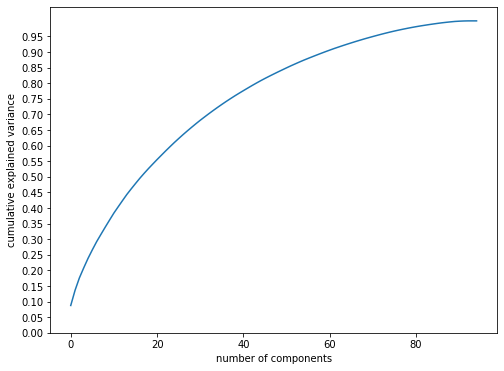

In [153]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
neighborhood_name = toronto_grouped['Neighborhood']
df_grouped_clustering = toronto_grouped.drop('Neighborhood', 1)

scaler = MinMaxScaler(feature_range=[0, 1])
data_rescaled = scaler.fit_transform(df_grouped_clustering)

pca = PCA().fit(data_rescaled)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.yticks(np.arange(0, 1.0, step=0.05))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

We need 90 components describe approximately 100% of the variance.

We need 90 components describe approximately 100% of the variance.

In [154]:
pca = PCA(n_components=90)
toronto_dataset = pca.fit_transform(data_rescaled)

### Elbow Method to determine the number of clusters

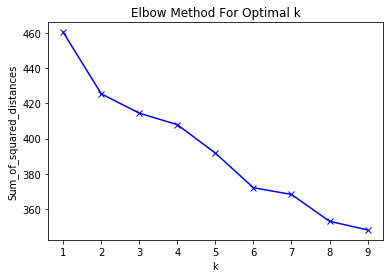

In [155]:
Sum_of_squared_distances = []
k = range(1, 10)
for kclusters in k:
    km = KMeans(n_clusters=kclusters,random_state=10).fit(toronto_dataset)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(k, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

As you can see, there is not any elbow in the graph. So we can use another method called Silhoutte Method to determine number of clusters.

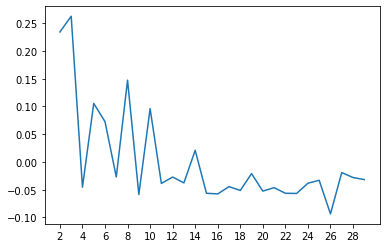

In [192]:
from sklearn.metrics import silhouette_samples, silhouette_score

no_of_clusters = range(2,30)
silhoutte_score_values = []
for n_clusters in no_of_clusters: 
  
    cluster = KMeans(n_clusters = n_clusters) 
    cluster_labels = cluster.fit_predict(toronto_dataset) 
  
    # The silhouette_score gives the  
    # average value for all the samples. 
    silhouette_avg = silhouette_score(toronto_dataset, cluster_labels) 
    silhoutte_score_values.append(silhouette_avg)
   
plt.plot(no_of_clusters, silhoutte_score_values)
plt.xticks(np.arange(min(no_of_clusters), max(no_of_clusters)+1, 2.0))
plt.show()

Optimal value for clustering is 3.

### Function to return top 5 venues

In [157]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [158]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
toronto_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
toronto_neighborhoods_venues_sorted['Neighborhood'] = toronto_grouped['Neighborhood']

for ind in np.arange(toronto_grouped.shape[0]):
    toronto_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)

toronto_neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Lounge,Latin American Restaurant,Skating Rink,Clothing Store,Breakfast Spot,Falafel Restaurant,Event Space,Farmers Market,Ethiopian Restaurant,Discount Store
1,"Alderwood, Long Branch",Pizza Place,Pharmacy,Athletics & Sports,Dance Studio,Coffee Shop,Pub,Sandwich Place,Gym,Airport Terminal,Diner
2,"Bathurst Manor, Wilson Heights, Downsview North",Coffee Shop,Bank,Grocery Store,Mobile Phone Shop,Bridal Shop,Shopping Mall,Sandwich Place,Diner,Supermarket,Sushi Restaurant
3,Bayview Village,Café,Bank,Chinese Restaurant,Japanese Restaurant,Yoga Studio,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant
4,"Bedford Park, Lawrence Manor East",Sandwich Place,Italian Restaurant,Restaurant,Coffee Shop,Comfort Food Restaurant,Hobby Shop,Juice Bar,Butcher,Japanese Restaurant,Café


## KMeans Clustering

In [159]:
kmeans = KMeans(n_clusters=3,random_state=0)
toronto_grouped_clustering =grouped.drop('Neighborhood', 1)
kmeans.fit(toronto_grouped_clustering)

centroids = kmeans.cluster_centers_
labels = kmeans.labels_
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 2, 0])

In [160]:
toronto_neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

toronto_merged_data = df2
toronto_merged_data = toronto_merged_data.join(toronto_neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood', how = 'right')
toronto_merged_data.head()

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Scarborough,"Malvern, Rouge",43.806686,-79.194353,0,Fast Food Restaurant,Yoga Studio,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant
1,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497,0,Construction & Landscaping,Bar,Yoga Studio,Dumpling Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant
2,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711,0,Breakfast Spot,Intersection,Bank,Electronics Store,Rental Car Location,Medical Center,Mexican Restaurant,Yoga Studio,Donut Shop,Dog Run
3,Scarborough,Woburn,43.770992,-79.216917,0,Coffee Shop,Korean Restaurant,Yoga Studio,Eastern European Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant
4,Scarborough,Cedarbrae,43.773136,-79.239476,0,Caribbean Restaurant,Fried Chicken Joint,Bank,Athletics & Sports,Thai Restaurant,Gas Station,Bakery,Hakka Restaurant,Electronics Store,Eastern European Restaurant


In [161]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged_data['Latitude'], toronto_merged_data['Longitude'], toronto_merged_data['Neighborhood'], toronto_merged_data['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Examine Clusters

In [162]:
toronto_cluster_0 = toronto_merged_data.loc[toronto_merged_data['Cluster Labels'] == 0, toronto_merged_data.columns[[1] + list(range(4, toronto_merged_data.shape[1]))]]

toronto_cluster_1 = toronto_merged_data.loc[toronto_merged_data['Cluster Labels'] == 1, toronto_merged_data.columns[[1] + list(range(4, toronto_merged_data.shape[1]))]]

toronto_cluster_2 = toronto_merged_data.loc[toronto_merged_data['Cluster Labels'] == 2, toronto_merged_data.columns[[1] + list(range(4, toronto_merged_data.shape[1]))]]

In [163]:
toronto_cluster_0

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,"Malvern, Rouge",0,Fast Food Restaurant,Yoga Studio,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant
1,"Rouge Hill, Port Union, Highland Creek",0,Construction & Landscaping,Bar,Yoga Studio,Dumpling Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant
2,"Guildwood, Morningside, West Hill",0,Breakfast Spot,Intersection,Bank,Electronics Store,Rental Car Location,Medical Center,Mexican Restaurant,Yoga Studio,Donut Shop,Dog Run
3,Woburn,0,Coffee Shop,Korean Restaurant,Yoga Studio,Eastern European Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant
4,Cedarbrae,0,Caribbean Restaurant,Fried Chicken Joint,Bank,Athletics & Sports,Thai Restaurant,Gas Station,Bakery,Hakka Restaurant,Electronics Store,Eastern European Restaurant
5,Scarborough Village,0,Playground,Construction & Landscaping,Yoga Studio,Eastern European Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant
6,"Kennedy Park, Ionview, East Birchmount Park",0,Bus Station,Convenience Store,Department Store,Coffee Shop,Discount Store,Yoga Studio,Dumpling Restaurant,Dog Run,Doner Restaurant,Donut Shop
7,"Golden Mile, Clairlea, Oakridge",0,Bakery,Bus Line,Ice Cream Shop,Bus Station,Park,Intersection,Metro Station,Soccer Field,Dog Run,Doner Restaurant
8,"Cliffside, Cliffcrest, Scarborough Village West",0,American Restaurant,Motel,Diner,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Yoga Studio
9,"Birch Cliff, Cliffside West",0,College Stadium,General Entertainment,Skating Rink,Café,Drugstore,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop


In [164]:
toronto_cluster_1

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
91,"Old Mill South, King's Mill Park, Sunnylea, Hu...",1,Baseball Field,Yoga Studio,Dumpling Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Eastern European Restaurant,Diner
97,"Humberlea, Emery",1,Food Service,Baseball Field,Filipino Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Yoga Studio


In [165]:
toronto_cluster_2

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,"Milliken, Agincourt North, Steeles East, L'Amo...",2,Park,Playground,Yoga Studio,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore
23,York Mills West,2,Park,Convenience Store,Yoga Studio,Eastern European Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant
25,Parkwoods,2,Food & Drink Shop,Fireworks Store,Park,Eastern European Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant
40,"East Toronto, Broadview North (Old East York)",2,Park,Intersection,Convenience Store,Metro Station,Yoga Studio,Dumpling Restaurant,Dog Run,Doner Restaurant,Donut Shop,Drugstore
44,Lawrence Park,2,Park,Bus Line,Swim School,Yoga Studio,Drugstore,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant
48,"Moore Park, Summerhill East",2,Gym,Park,Yoga Studio,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore
50,Rosedale,2,Park,Playground,Trail,Drugstore,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop
74,Caledonia-Fairbanks,2,Park,Women's Store,Pool,Yoga Studio,Dumpling Restaurant,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop
90,"The Kingsway, Montgomery Road, Old Mill North",2,Park,River,Yoga Studio,Drugstore,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant
98,Weston,2,Park,Convenience Store,Yoga Studio,Eastern European Restaurant,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant


## Explore New York Data

New York City has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood.

This dataset exists for free on the web. The link to the dataset: https://geo.nyu.edu/catalog/nyu_2451_34572


In [166]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
print('Data downloaded!')

Data downloaded!


In [167]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [168]:
neighborhoods_data = newyork_data['features']

In [169]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

### Transfrom json data into dataframe

In [170]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
new_york_data = pd.DataFrame(columns=column_names)

In [171]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_latitude = neighborhood_latlon[1]
    neighborhood_longitude = neighborhood_latlon[0]
    
    new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_latitude,
                                          'Longitude': neighborhood_longitude}, ignore_index=True)

In [172]:
new_york_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [173]:
new_york_data.shape

(306, 4)

In [174]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(new_york_data['Borough'].unique()),
        new_york_data.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


### Use geopy library to get the latitude and longitude values of New York.

In [175]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent = 'my-application')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))


The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [176]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

### Top 100 venues in New York City 

In [178]:
new_york_venues = getNearbyVenues(names=new_york_data['Neighborhood'],
                                   latitudes=new_york_data['Latitude'],
                                   longitudes=new_york_data['Longitude']
                                  )

Found 9955 venues in 306 neighborhoods.


In [179]:
print(new_york_venues.shape)
new_york_venues.head()

(9955, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,40.890487,-73.848568,Ice Cream Shop
2,Wakefield,40.894705,-73.847201,Walgreens,40.896528,-73.844700,Pharmacy
3,Wakefield,40.894705,-73.847201,Rite Aid,40.896649,-73.844846,Pharmacy
4,Wakefield,40.894705,-73.847201,Dunkin',40.890459,-73.849089,Donut Shop


In [180]:
ny_onehot = pd.get_dummies(new_york_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ny_onehot['Neighborhood'] = new_york_venues['Neighborhood'] 

# move neighborhood column to the first column
col_list = list(ny_onehot.columns)
col_list.remove('Neighborhood')
cols = ['Neighborhood'] + [col for col in col_list]

ny_onehot = ny_onehot[cols]
ny_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,

In [181]:
ny_grouped = ny_onehot.groupby('Neighborhood').mean().reset_index()
ny_grouped

,Neighborhood,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cooking School,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,

In [182]:
ny_grouped.shape

(301, 430)

In [183]:
num_top_venues = 10

for hood in ny_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = ny_grouped[ny_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
                  venue  freq
0           Pizza Place  0.15
1         Deli / Bodega  0.08
2           Supermarket  0.08
3    Spanish Restaurant  0.04
4              Pharmacy  0.04
5    Chinese Restaurant  0.04
6  Fast Food Restaurant  0.04
7           Bus Station  0.04
8                Bakery  0.04
9            Playground  0.04


----Annadale----
                 venue  freq
0          Pizza Place  0.21
1        Deli / Bodega  0.07
2         Dance Studio  0.07
3                 Food  0.07
4  American Restaurant  0.07
5           Restaurant  0.07
6                Diner  0.07
7       Cosmetics Shop  0.07
8                 Park  0.07
9             Pharmacy  0.07


----Arden Heights----
                  venue  freq
0           Coffee Shop  0.25
1              Bus Stop  0.25
2           Pizza Place  0.25
3              Pharmacy  0.25
4     Accessories Store  0.00
5  Pakistani Restaurant  0.00
6           Pet Service  0.00
7              Pet Café  0.00
8   Peruvian Restaura

9        Shipping Store  0.02


----Carroll Gardens----
                venue  freq
0  Italian Restaurant  0.11
1         Coffee Shop  0.07
2         Pizza Place  0.05
3        Cocktail Bar  0.04
4              Bakery  0.04
5                 Bar  0.03
6           Wine Shop  0.03
7                 Spa  0.03
8      Ice Cream Shop  0.02
9     Thai Restaurant  0.02


----Castle Hill----
                             venue  freq
0                      Supermarket  0.14
1                            Diner  0.14
2                             Bank  0.14
3                           Market  0.14
4                      Pizza Place  0.14
5  Southern / Soul Food Restaurant  0.14
6                         Pharmacy  0.14
7             Other Great Outdoors  0.00
8                         Pet Café  0.00
9              Peruvian Restaurant  0.00


----Castleton Corners----
                 venue  freq
0          Pizza Place  0.16
1                 Bank  0.11
2  Japanese Restaurant  0.05
3           Bagel S

9         Grocery Store  0.03


----Emerson Hill----
                        venue  freq
0               Historic Site   0.5
1  Construction & Landscaping   0.5
2           Accessories Store   0.0
3        Pakistani Restaurant   0.0
4                   Pet Store   0.0
5                 Pet Service   0.0
6                    Pet Café   0.0
7         Peruvian Restaurant   0.0
8          Persian Restaurant   0.0
9                Perfume Shop   0.0


----Erasmus----
                    venue  freq
0    Caribbean Restaurant  0.21
1             Yoga Studio  0.05
2                    Bank  0.05
3          Ice Cream Shop  0.05
4       Mobile Phone Shop  0.05
5    Gym / Fitness Center  0.05
6             Music Venue  0.05
7  Furniture / Home Store  0.05
8              Food Truck  0.05
9                Pharmacy  0.05


----Far Rockaway----
                  venue  freq
0         Deli / Bodega  0.10
1         Grocery Store  0.10
2           Supermarket  0.10
3           Pizza Place  0.10
4    Chi

                   venue  freq
0               Bus Stop  0.50
1          Grocery Store  0.25
2          Boat or Ferry  0.25
3      Accessories Store  0.00
4               Pet Café  0.00
5    Peruvian Restaurant  0.00
6     Persian Restaurant  0.00
7           Perfume Shop  0.00
8  Performing Arts Venue  0.00
9       Pedestrian Plaza  0.00


----Grant City----
                     venue  freq
0     Fast Food Restaurant  0.10
1              Pizza Place  0.10
2             Dessert Shop  0.05
3         Asian Restaurant  0.05
4        French Restaurant  0.05
5            Grocery Store  0.05
6            Tanning Salon  0.05
7        Food & Drink Shop  0.05
8       Chinese Restaurant  0.05
9  Health & Beauty Service  0.05


----Grasmere----
              venue  freq
0          Bus Stop  0.13
1     Grocery Store  0.09
2        Bagel Shop  0.09
3    Cosmetics Shop  0.04
4        Nail Salon  0.04
5              Park  0.04
6          Pharmacy  0.04
7  Business Service  0.04
8  Basketball Court  0

9         Perfume Shop  0.00


----Jamaica Hills----
                  venue  freq
0     Indian Restaurant  0.08
1  Fast Food Restaurant  0.08
2              Pharmacy  0.08
3   Fried Chicken Joint  0.08
4    Chinese Restaurant  0.08
5            Donut Shop  0.08
6     Convenience Store  0.04
7         Shopping Mall  0.04
8       Thai Restaurant  0.04
9      Halal Restaurant  0.04


----Kensington----
                venue  freq
0       Grocery Store  0.11
1     Thai Restaurant  0.08
2      Sandwich Place  0.05
3      Ice Cream Shop  0.05
4          Restaurant  0.05
5         Pizza Place  0.05
6                 Gym  0.03
7          Bagel Shop  0.03
8              Bakery  0.03
9  Mexican Restaurant  0.03


----Kew Gardens----
                venue  freq
0  Chinese Restaurant  0.07
1   Indian Restaurant  0.04
2                Bank  0.04
3                 Bar  0.04
4      Cosmetics Shop  0.04
5         Pizza Place  0.04
6       Deli / Bodega  0.04
7               Track  0.02
8             

                  venue  freq
0           Bus Station  0.15
1            Donut Shop  0.10
2  Fast Food Restaurant  0.10
3        Discount Store  0.10
4         Grocery Store  0.10
5        Ice Cream Shop  0.05
6         Metro Station  0.05
7           Pizza Place  0.05
8    Seafood Restaurant  0.05
9           Fish Market  0.05


----Mott Haven----
                 venue  freq
0          Pizza Place  0.13
1   Spanish Restaurant  0.13
2                  Gym  0.09
3           Donut Shop  0.09
4  Peruvian Restaurant  0.04
5    Fish & Chips Shop  0.04
6            Bookstore  0.04
7        Grocery Store  0.04
8    Mobile Phone Shop  0.04
9               Bakery  0.04


----Mount Eden----
                  venue  freq
0              Pharmacy  0.12
1  Fast Food Restaurant  0.09
2    Chinese Restaurant  0.06
3           Pizza Place  0.06
4         Grocery Store  0.06
5    Spanish Restaurant  0.06
6        Sandwich Place  0.03
7      Video Game Store  0.03
8    Mexican Restaurant  0.03
9        

9            Sports Bar  0.03


----Pelham Gardens----
                venue  freq
0            Pharmacy  0.10
1         Bus Station  0.10
2  Chinese Restaurant  0.10
3         Pizza Place  0.10
4        Intersection  0.05
5                Bank  0.05
6          Playground  0.05
7       Boat or Ferry  0.05
8       Grocery Store  0.05
9      Sandwich Place  0.05


----Pelham Parkway----
                   venue  freq
0            Bus Station  0.08
1     Italian Restaurant  0.08
2            Pizza Place  0.08
3                    Spa  0.04
4            Coffee Shop  0.04
5             Smoke Shop  0.04
6  Performing Arts Venue  0.04
7     Chinese Restaurant  0.04
8                  Track  0.04
9                   Bank  0.04


----Pleasant Plains----
          venue  freq
0   Pizza Place  0.15
1    Donut Shop  0.10
2   Yoga Studio  0.05
3  Liquor Store  0.05
4    Toll Plaza  0.05
5          Bank  0.05
6        Bakery  0.05
7   Flower Shop  0.05
8          Food  0.05
9     Pet Store  0.05


-

9          Pizza Place  0.03


----Rosebank----
                venue  freq
0       Grocery Store  0.08
1  Italian Restaurant  0.08
2      Ice Cream Shop  0.04
3      Cosmetics Shop  0.04
4            Pharmacy  0.04
5               Beach  0.04
6  Mexican Restaurant  0.04
7         Pizza Place  0.04
8                 Bar  0.04
9          Bagel Shop  0.04


----Rosedale----
                  venue  freq
0     Accessories Store  0.08
1        Cosmetics Shop  0.08
2            Smoke Shop  0.08
3    Chinese Restaurant  0.08
4  Caribbean Restaurant  0.08
5        Sandwich Place  0.08
6          Liquor Store  0.08
7              Pharmacy  0.08
8   Fried Chicken Joint  0.08
9         Jewelry Store  0.08


----Rossville----
                 venue  freq
0           Bagel Shop  0.21
1          Pizza Place  0.21
2         Liquor Store  0.07
3        Moving Target  0.07
4       Ice Cream Shop  0.07
5           Donut Shop  0.07
6    Convenience Store  0.07
7        Grocery Store  0.07
8  American Re



----Steinway----
                  venue  freq
0        Cosmetics Shop  0.12
1   Rental Car Location  0.12
2   Japanese Restaurant  0.04
3      Business Service  0.04
4           Men's Store  0.04
5  Gym / Fitness Center  0.04
6               Brewery  0.04
7      Sushi Restaurant  0.04
8           Supermarket  0.04
9                  Café  0.04


----Stuyvesant Town----
                  venue  freq
0         Boat or Ferry  0.11
1                  Park  0.11
2          Cocktail Bar  0.06
3            Playground  0.06
4              Fountain  0.06
5  Gym / Fitness Center  0.06
6                Bistro  0.06
7       Harbor / Marina  0.06
8              Heliport  0.06
9           Pet Service  0.06


----Sunnyside----
                       venue  freq
0                Pizza Place  0.10
1         Chinese Restaurant  0.06
2              Deli / Bodega  0.06
3                     Bakery  0.06
4         Italian Restaurant  0.06
5             Discount Store  0.04
6                Coffee Shop  

### Implementing PCA in order to reduce dimensionality

Text(0, 0.5, 'cumulative explained variance')

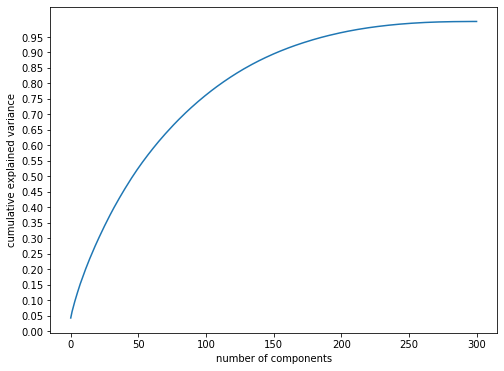

In [184]:
neighborhood_name = ny_grouped['Neighborhood']
df_grouped_ny_clustering = ny_grouped.drop('Neighborhood', 1)

scaler = MinMaxScaler(feature_range=[0, 1])
ny_data_rescaled = scaler.fit_transform(df_grouped_ny_clustering)

pca = PCA().fit(ny_data_rescaled)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.yticks(np.arange(0, 1.0, step=0.05))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [ ]:
pca = PCA(n_components=90)
ny_dataset = pca.fit_transform(data_rescaled)

### Elbow method to determine number of clusters

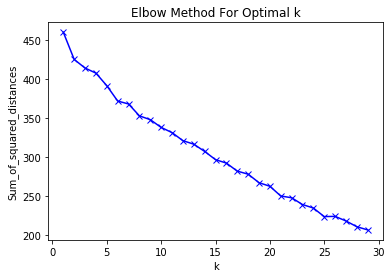

In [189]:
Sum_of_squared_distances = []
k = range(1, 30)
for kclusters in k:
    km = KMeans(n_clusters=kclusters,random_state=10).fit(dataset)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(k, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

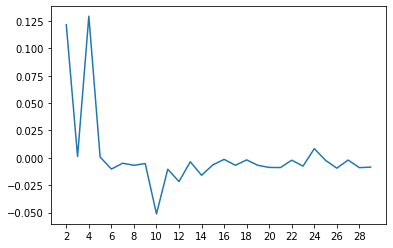

In [200]:
no_of_clusters = range(2,30)
silhoutte_score_values = []
for n_clusters in no_of_clusters: 
  
    cluster = KMeans(n_clusters = n_clusters) 
    cluster_labels = cluster.fit_predict(ny_dataset) 
  
    # The silhouette_score gives the  
    # average value for all the samples. 
    silhouette_avg = silhouette_score(ny_dataset, cluster_labels) 
    silhoutte_score_values.append(silhouette_avg)
   
plt.plot(no_of_clusters, silhoutte_score_values)
plt.xticks(np.arange(min(no_of_clusters), max(no_of_clusters)+1, 2.0))
plt.show()

In [204]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
ny_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
ny_neighborhoods_venues_sorted['Neighborhood'] = ny_grouped['Neighborhood']

for ind in np.arange(ny_grouped.shape[0]):
    ny_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(ny_grouped.iloc[ind, :], num_top_venues)

ny_neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Pizza Place,Deli / Bodega,Supermarket,Intersection,Fast Food Restaurant,Grocery Store,Gas Station,Breakfast Spot,Bus Station,Spanish Restaurant
1,Annadale,Pizza Place,Food,Sports Bar,Pharmacy,Diner,Restaurant,Deli / Bodega,Train Station,American Restaurant,Dance Studio
2,Arden Heights,Pharmacy,Coffee Shop,Bus Stop,Pizza Place,Yoga Studio,Filipino Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant
3,Arlington,Bus Stop,Playground,Home Service,Intersection,American Restaurant,Deli / Bodega,Boat or Ferry,Fast Food Restaurant,Filipino Restaurant,Field
4,Arrochar,Italian Restaurant,Deli / Bodega,Bus Stop,Athletics & Sports,Food Truck,Bagel Shop,Mediterranean Restaurant,Pizza Place,Middle Eastern Restaurant,Hotel


## KMeans Clustering

In [203]:
kmeans = KMeans(n_clusters=5,random_state=0)
df_grouped_clustering =ny_grouped.drop('Neighborhood', 1)
kmeans.fit(df_grouped_clustering)

centroids = kmeans.cluster_centers_
labels = kmeans.labels_
labels

array([4, 4, 0, 0, 2, 2, 2, 2, 2, 4, 2, 2, 2, 4, 2, 2, 4, 2, 2, 2, 2, 4,
       2, 4, 2, 4, 0, 2, 4, 2, 2, 2, 4, 4, 4, 2, 3, 2, 4, 2, 2, 1, 1, 2,
       2, 4, 4, 2, 2, 2, 2, 2, 4, 2, 4, 0, 4, 2, 2, 4, 2, 4, 2, 4, 4, 2,
       4, 2, 4, 4, 2, 4, 4, 2, 2, 2, 4, 1, 2, 4, 4, 2, 2, 4, 4, 4, 2, 2,
       2, 2, 4, 2, 1, 4, 4, 2, 4, 2, 1, 4, 2, 4, 2, 4, 2, 2, 0, 4, 2, 4,
       2, 4, 4, 2, 2, 0, 4, 4, 4, 2, 2, 4, 2, 3, 2, 2, 4, 4, 4, 4, 4, 4,
       4, 2, 2, 4, 2, 4, 2, 2, 2, 2, 4, 4, 4, 4, 4, 4, 1, 2, 2, 2, 2, 4,
       2, 2, 2, 4, 2, 2, 2, 2, 4, 2, 2, 4, 4, 4, 3, 4, 4, 2, 2, 2, 2, 4,
       4, 2, 2, 4, 4, 4, 4, 4, 4, 2, 2, 0, 2, 2, 4, 4, 2, 4, 4, 2, 4, 4,
       2, 4, 4, 2, 1, 4, 2, 0, 2, 4, 4, 4, 4, 4, 2, 4, 2, 4, 4, 2, 2, 4,
       4, 4, 2, 0, 2, 2, 4, 1, 4, 2, 4, 4, 4, 4, 2, 2, 2, 2, 4, 4, 2, 4,
       2, 4, 2, 2, 2, 2, 2, 0, 4, 3, 4, 2, 2, 4, 4, 1, 2, 4, 4, 2, 2, 2,
       2, 4, 2, 2, 0, 2, 2, 2, 2, 2, 2, 4, 4, 2, 2, 4, 4, 2, 4, 2, 2, 2,
       4, 2, 4, 2, 3, 1, 2, 0, 2, 4, 4, 4, 4, 4, 2]

In [205]:
ny_neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

ny_merged_data = new_york_data
ny_merged_data = ny_merged_data.join(ny_neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood', how = 'right')
ny_merged_data.head()

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,4,Pharmacy,Food,Donut Shop,Sandwich Place,Ice Cream Shop,Gas Station,Dessert Shop,Laundromat,Deli / Bodega,Food & Drink Shop
1,Bronx,Co-op City,40.874294,-73.829939,4,Bus Station,Fast Food Restaurant,Fried Chicken Joint,Pizza Place,Baseball Field,Park,Grocery Store,Bagel Shop,Trail,Pharmacy
2,Bronx,Eastchester,40.887556,-73.827806,4,Caribbean Restaurant,Bus Station,Diner,Deli / Bodega,Bus Stop,Platform,Bakery,Seafood Restaurant,Fast Food Restaurant,Donut Shop
3,Bronx,Fieldston,40.895437,-73.905643,4,Plaza,River,Bus Station,Business Service,Film Studio,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant
4,Bronx,Riverdale,40.890834,-73.912585,4,Bus Station,Park,Baseball Field,Bank,Gym,Plaza,Playground,Filipino Restaurant,Event Space,Exhibit


In [206]:
ny_map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

markers_colors = []
for lat, lon, poi, cluster in zip(ny_merged_data['Latitude'], ny_merged_data['Longitude'], ny_merged_data['Neighborhood'], ny_merged_data['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(ny_map_clusters)
       
ny_map_clusters

## Examine Clusters

In [207]:
ny_cluster_0 = ny_merged_data.loc[ny_merged_data['Cluster Labels'] == 0, ny_merged_data.columns[[1] + list(range(4, ny_merged_data.shape[1]))]]

ny_cluster_1 = ny_merged_data.loc[ny_merged_data['Cluster Labels'] == 1, ny_merged_data.columns[[1] + list(range(4, ny_merged_data.shape[1]))]]

ny_cluster_2 = ny_merged_data.loc[ny_merged_data['Cluster Labels'] == 2, ny_merged_data.columns[[1] + list(range(4, ny_merged_data.shape[1]))]]

ny_cluster_3 = ny_merged_data.loc[ny_merged_data['Cluster Labels'] == 3, ny_merged_data.columns[[1] + list(range(4, ny_merged_data.shape[1]))]]

ny_cluster_4 = ny_merged_data.loc[ny_merged_data['Cluster Labels'] == 4, ny_merged_data.columns[[1] + list(range(4, ny_merged_data.shape[1]))]]

In [208]:
ny_cluster_0

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
27,Clason Point,0,Park,Bus Stop,Convenience Store,Boat or Ferry,Pool,Grocery Store,South American Restaurant,Farm,Film Studio,Falafel Restaurant
192,Somerville,0,Park,Yoga Studio,Entertainment Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant
198,New Brighton,0,Deli / Bodega,Bus Stop,Park,Playground,Bowling Alley,Discount Store,Fish & Chips Shop,Factory,Falafel Restaurant,Farm
203,Todt Hill,0,Trail,Park,Yoga Studio,Filipino Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
224,Park Hill,0,Bus Stop,Hotel,Coffee Shop,Gym / Fitness Center,Park,Athletics & Sports,Yoga Studio,Exhibit,Factory,Falafel Restaurant
226,Graniteville,0,Bus Stop,Boat or Ferry,Grocery Store,Yoga Studio,Financial or Legal Service,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
227,Arlington,0,Bus Stop,Playground,Home Service,Intersection,American Restaurant,Deli / Bodega,Boat or Ferry,Fast Food Restaurant,Filipino Restaurant,Field
241,Arden Heights,0,Pharmacy,Coffee Shop,Bus Stop,Pizza Place,Yoga Studio,Filipino Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant
245,Bloomfield,0,Recreation Center,Burger Joint,Theme Park,Bus Stop,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
256,Randall Manor,0,Playground,Park,Bus Stop,Pizza Place,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm


In [209]:
ny_cluster_1

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
9,Williamsbridge,1,Nightclub,Caribbean Restaurant,Soup Place,Bar,Film Studio,Event Space,Exhibit,Factory,Falafel Restaurant,Farm
41,Olinville,1,Caribbean Restaurant,Fried Chicken Joint,Food,Metro Station,Liquor Store,Laundromat,Basketball Court,Deli / Bodega,Supermarket,Field
56,East Flatbush,1,Caribbean Restaurant,Department Store,Chinese Restaurant,Liquor Store,Pharmacy,Moving Target,Food & Drink Shop,Fast Food Restaurant,Supermarket,Park
74,Canarsie,1,Chinese Restaurant,Caribbean Restaurant,Food,Gym,Asian Restaurant,Yoga Studio,Filipino Restaurant,Exhibit,Factory,Falafel Restaurant
75,Flatlands,1,Pharmacy,Fast Food Restaurant,Caribbean Restaurant,Fried Chicken Joint,Park,Lounge,Bar,Paper / Office Supplies Store,Discount Store,Video Store
165,St. Albans,1,Caribbean Restaurant,Donut Shop,Discount Store,Shopping Mall,Health Food Store,Seafood Restaurant,Fast Food Restaurant,Café,Motorcycle Shop,Southern / Soul Food Restaurant
168,Cambria Heights,1,Caribbean Restaurant,Pharmacy,Chinese Restaurant,Nightclub,Cosmetics Shop,Bakery,Restaurant,Flower Shop,Gym / Fitness Center,Liquor Store
188,Laurelton,1,Caribbean Restaurant,Cosmetics Shop,Park,Train Station,Sculpture Garden,Yoga Studio,Field,Ethiopian Restaurant,Event Space,Exhibit
259,Remsen Village,1,Caribbean Restaurant,Fast Food Restaurant,Fried Chicken Joint,Fish Market,Spa,Sandwich Place,Pharmacy,Gym,Breakfast Spot,Supermarket
300,Erasmus,1,Caribbean Restaurant,Yoga Studio,Furniture / Home Store,Sandwich Place,Donut Shop,Gym / Fitness Center,Pharmacy,Playground,Bank,Food Truck


In [210]:
ny_cluster_2

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
12,City Island,2,Seafood Restaurant,Thrift / Vintage Store,Spanish Restaurant,Arts & Crafts Store,Park,Harbor / Marina,Boat or Ferry,Baseball Field,Bar,Bank
22,Port Morris,2,Cupcake Shop,Distillery,Food Truck,Music Venue,Brewery,Furniture / Home Store,Spanish Restaurant,Donut Shop,Latin American Restaurant,Peruvian Restaurant
28,Throgs Neck,2,Bar,American Restaurant,Asian Restaurant,Mobile Phone Shop,Coffee Shop,Pizza Place,Deli / Bodega,Sports Bar,Italian Restaurant,Factory
29,Country Club,2,Sandwich Place,Playground,Weight Loss Center,Flea Market,Athletics & Sports,Filipino Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Factory
34,Belmont,2,Italian Restaurant,Pizza Place,Deli / Bodega,Bakery,Donut Shop,Dessert Shop,Bank,Fried Chicken Joint,Spanish Restaurant,Shoe Store
39,Edgewater Park,2,Italian Restaurant,Deli / Bodega,Pizza Place,Asian Restaurant,Park,Donut Shop,Pub,Coffee Shop,Chinese Restaurant,Spa
46,Bay Ridge,2,Spa,Italian Restaurant,Pizza Place,Greek Restaurant,Thai Restaurant,American Restaurant,Bar,Sushi Restaurant,Grocery Store,Chinese Restaurant
49,Greenpoint,2,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Yoga Studio,Sushi Restaurant,Deli / Bodega,French Restaurant,Café,New American Restaurant
51,Brighton Beach,2,Beach,Restaurant,Eastern European Restaurant,Russian Restaurant,Mobile Phone Shop,Gourmet Shop,Sushi Restaurant,Bank,Other Great Outdoors,Food & Drink Shop
52,Sheepshead Bay,2,Dessert Shop,Turkish Restaurant,Sandwich Place,Yoga Studio,Hotel,Chinese Restaurant,Miscellaneous Shop,Harbor / Marina,Outlet Store,Bagel Shop


In [211]:
ny_cluster_3

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
150,Whitestone,3,Bubble Tea Shop,Dance Studio,Deli / Bodega,Candy Store,Yoga Studio,Financial or Legal Service,Exhibit,Factory,Falafel Restaurant,Farm
193,Brookville,3,Deli / Bodega,Yoga Studio,Financial or Legal Service,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
202,Grymes Hill,3,Deli / Bodega,Dog Run,Yoga Studio,Financial or Legal Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market
204,South Beach,3,Deli / Bodega,Pier,Beach,Athletics & Sports,Yoga Studio,Financial or Legal Service,Exhibit,Factory,Falafel Restaurant,Farm
206,Mariner's Harbor,3,Italian Restaurant,Deli / Bodega,Supermarket,Athletics & Sports,Fish & Chips Shop,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market


In [212]:
ny_cluster_4

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Wakefield,4,Pharmacy,Food,Donut Shop,Sandwich Place,Ice Cream Shop,Gas Station,Dessert Shop,Laundromat,Deli / Bodega,Food & Drink Shop
1,Co-op City,4,Bus Station,Fast Food Restaurant,Fried Chicken Joint,Pizza Place,Baseball Field,Park,Grocery Store,Bagel Shop,Trail,Pharmacy
2,Eastchester,4,Caribbean Restaurant,Bus Station,Diner,Deli / Bodega,Bus Stop,Platform,Bakery,Seafood Restaurant,Fast Food Restaurant,Donut Shop
3,Fieldston,4,Plaza,River,Bus Station,Business Service,Film Studio,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant
4,Riverdale,4,Bus Station,Park,Baseball Field,Bank,Gym,Plaza,Playground,Filipino Restaurant,Event Space,Exhibit
5,Kingsbridge,4,Pizza Place,Bar,Mexican Restaurant,Latin American Restaurant,Sandwich Place,Supermarket,Bakery,Spanish Restaurant,Fast Food Restaurant,Pub
6,Marble Hill,4,Sandwich Place,Coffee Shop,Gym,Yoga Studio,Bank,Deli / Bodega,Department Store,Diner,Pizza Place,Discount Store
7,Woodlawn,4,Pub,Deli / Bodega,Pizza Place,Food & Drink Shop,Bar,Playground,Park,Grocery Store,Bakery,Trail
8,Norwood,4,Pizza Place,Park,Bank,Chinese Restaurant,Pharmacy,Fast Food Restaurant,Coffee Shop,Mexican Restaurant,Liquor Store,Caribbean Restaurant
10,Baychester,4,Donut Shop,Mattress Store,Men's Store,Pet Store,Bank,Mexican Restaurant,Pizza Place,Electronics Store,Discount Store,Fast Food Restaurant


In [215]:
ny_cluster_4['Neighborhood'].value_counts().sum()

128